# Data Management

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/deepfashion2_trousers_subset.zip

In [ ]:
!cp -r /content/content/deepfashion2_trousers_subset /content

In [ ]:
!rm -r /content/content/

In [ ]:
import os

file_path = "/content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/coco_format/validation_coco.json"

if os.path.exists(file_path):
    os.remove(file_path)
    print("File deleted successfully.")
else:
    print("File does not exist.")


File deleted successfully.


In [ ]:
!cp -r /content/validation_coco.json /content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/coco_format

# Install Detectron2

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-bo88boty
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-bo88boty
  Resolved https://github.com/facebookresearch/detectron2.git to commit 18f69583391e5040043ca4f4bebd2c60f0ebfde0
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.8 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp311-cp311-linux_x86_64.whl size=6434816 sha256=a16baa107b1ab7d67533dbca1dd8f222da14e5a82899f37dd5ebc0c97ac12c80
  Stored in directory: /tmp/pip-ephem-wheel-cache-ksqwuo5n/wheels/17/d9/40/60db98e485aa9455

# Register Dataset

In [ ]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog

# Paths
train_json = "/content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/coco_format/train_coco.json"
train_img_dir = "/content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/train/image"
val_json = "/content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/coco_format/validation_coco.json"
val_img_dir = "/content/deepfashion2_trousers_subset/Complete_Trousers_Dataset/validation/image"

# Register datasets
register_coco_instances("trousers_train", {}, train_json, train_img_dir)
register_coco_instances("trousers_val", {}, val_json, val_img_dir)

# Keypoint info
keypoint_names = [
    "left_waist", "right_waist", "left_hip", "right_hip",
    "left_knee", "right_knee", "left_ankle", "right_ankle",
    "crotch", "zipper", "button", "left_thigh", "right_thigh", "bottom_hem"
]

keypoint_flip_map = [
    ("left_waist", "right_waist"),
    ("left_hip", "right_hip"),
    ("left_knee", "right_knee"),
    ("left_ankle", "right_ankle"),
    ("left_thigh", "right_thigh")
]

# Set metadata for both datasets
for d in ["trousers_train", "trousers_val"]:
    meta = MetadataCatalog.get(d)
    meta.thing_classes = ["trousers"]
    meta.keypoint_names = keypoint_names
    meta.keypoint_flip_map = keypoint_flip_map
    meta.evaluator_type = "coco"


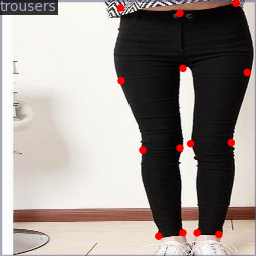

In [ ]:
import random
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load a sample
dataset_dicts = DatasetCatalog.get("trousers_train")
metadata = MetadataCatalog.get("trousers_train")

# Pick one random image to display
sample = random.choice(dataset_dicts)

# Load the image
img = cv2.imread(sample["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0)
out = visualizer.draw_dataset_dict(sample)
# Use cv2_imshow instead of cv2.imshow
cv2_imshow(out.get_image()[:, :, ::-1])

# Load Config and Trained Model

In [ ]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

cfg = get_cfg()

# Load base model config
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))

# Dataset setup
cfg.DATASETS.TRAIN = ("trousers_train",)
cfg.DATASETS.TEST = ("trousers_val",)

# Number of classes and keypoints
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 14

# Custom OKS sigmas (important for keypoint AP)
cfg.TEST.KEYPOINT_OKS_SIGMAS = [0.1] * 14  # Replace with correct values if you know them

cfg.DATALOADER.NUM_WORKERS = 2

# Load trained model
cfg.MODEL.WEIGHTS = "/content/deepfashion2_trousers_subset/output_trousers_keypoints/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Confidence threshold
cfg.OUTPUT_DIR = "/content/deepfashion2_trousers_subset/output_trousers_keypoints"


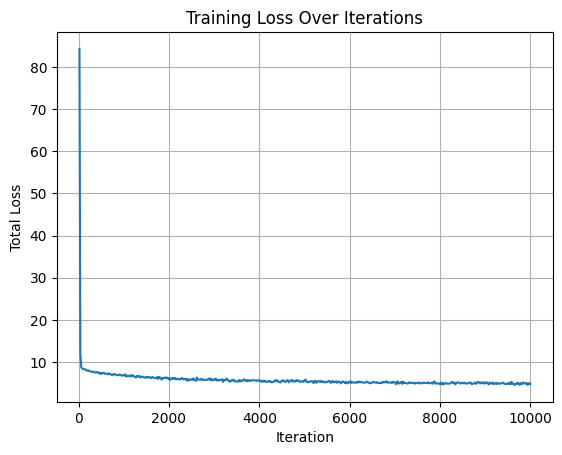

In [ ]:
import json
import matplotlib.pyplot as plt

metrics_path = "/content/deepfashion2_trousers_subset/output_trousers_keypoints/metrics.json"

losses = []
iterations = []

with open(metrics_path, 'r') as f:
    for line in f:
        try:
            data = json.loads(line)
            if "total_loss" in data:
                losses.append(data["total_loss"])
                iterations.append(data["iteration"])
        except:
            continue  # skip malformed lines if any

plt.plot(iterations, losses)
plt.title("Training Loss Over Iterations")
plt.xlabel("Iteration")
plt.ylabel("Total Loss")
plt.grid(True)
plt.show()

# Evaluate on Validation Set

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer

evaluator = COCOEvaluator("trousers_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "trousers_val")

model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)

inference_on_dataset(model, val_loader, evaluator)

JSONDecodeError: Extra data: line 141221 column 2 (char 2851960)

# Visualize Predictions

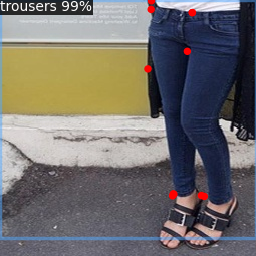

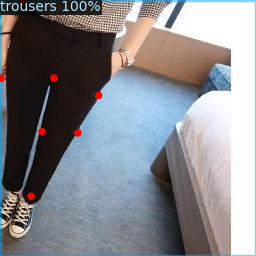

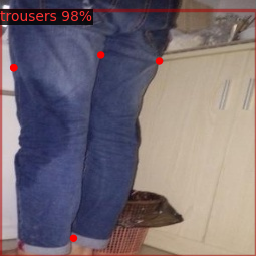

In [ ]:
import cv2, random
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog
from detectron2.engine import DefaultPredictor
from google.colab.patches import cv2_imshow

predictor = DefaultPredictor(cfg)
metadata = MetadataCatalog.get("trousers_val")
dataset_dicts = DatasetCatalog.get("trousers_val")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0, instance_mode=ColorMode.IMAGE)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

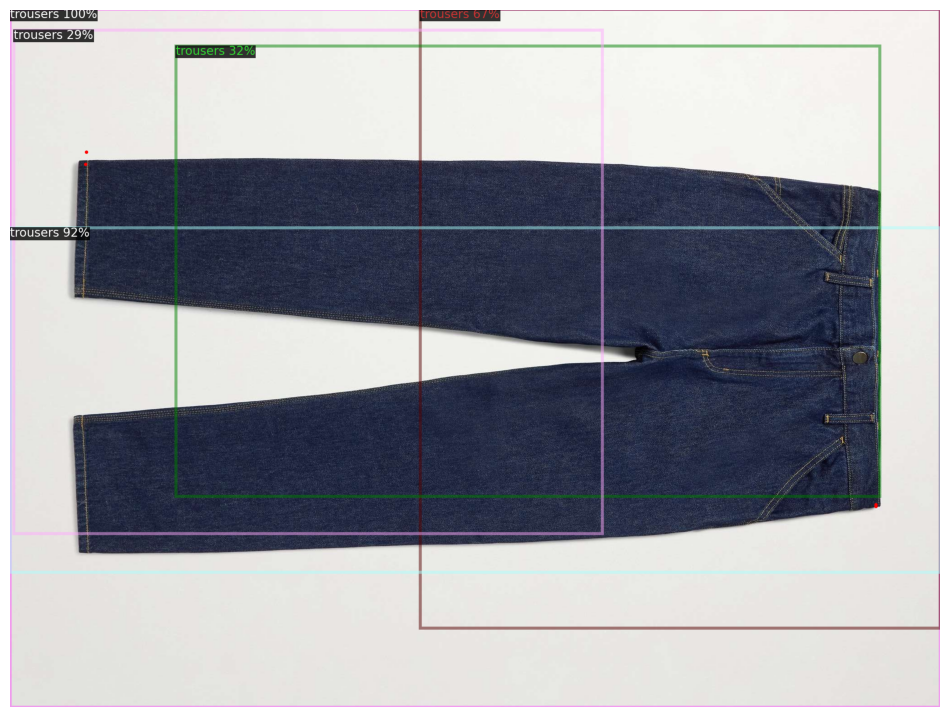

In [ ]:
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# 1. Setup config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))

# Dataset names
cfg.DATASETS.TRAIN = ("trousers_train",)
cfg.DATASETS.TEST = ("trousers_val",)

# Number of classes and keypoints
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 14

# Optional: OKS sigmas for keypoint evaluation (adjust if you know)
cfg.TEST.KEYPOINT_OKS_SIGMAS = [0.1] * 14

cfg.DATALOADER.NUM_WORKERS = 2

# Load your trained model weights
cfg.MODEL.WEIGHTS = "/content/deepfashion2_trousers_subset/output_trousers_keypoints/model_final.pth"

# Set lower confidence threshold to show more keypoints
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1

cfg.OUTPUT_DIR = "/content/deepfashion2_trousers_subset/output_trousers_keypoints"

# 2. Create predictor
predictor = DefaultPredictor(cfg)

# 3. Load test image
image_path = "/content/TT/e6d9769070001bad9bed0251087a56b83c2011ed33d5a91fc24d04bfef6b6426.jpg"
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 4. Run inference
outputs = predictor(img)

# 5. Visualize predictions
metadata = MetadataCatalog.get("trousers_val")
v = Visualizer(img_rgb, metadata=metadata, scale=1.0)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# 6. Show the image with predictions
plt.figure(figsize=(12, 12))
plt.imshow(out.get_image())
plt.axis("off")
plt.show()


In [ ]:
outputs = predictor(img)
print(outputs["instances"].pred_keypoints)


tensor([[[1.1902e+02, 1.2750e+01, 1.3287e-01],
         [1.2172e+02, 1.3650e+01, 8.5351e-02],
         [1.4571e+02, 7.5000e-01, 7.4646e-02],
         [1.4571e+02, 9.1500e+00, 6.4490e-02],
         [6.0255e+01, 2.2635e+02, 6.0594e-02],
         [6.0855e+01, 2.2605e+02, 6.4690e-02],
         [1.1212e+02, 2.2635e+02, 4.2170e-02],
         [1.1033e+02, 2.2635e+02, 5.2618e-02],
         [1.1902e+02, 1.3695e+02, 1.5067e-01],
         [1.1902e+02, 1.3605e+02, 5.9664e-02],
         [1.2442e+02, 2.2695e+02, 7.6354e-02],
         [1.7479e+02, 2.2605e+02, 8.0326e-02],
         [1.7449e+02, 2.2605e+02, 8.8834e-02],
         [1.6669e+02, 9.1050e+01, 9.9843e-02]]], device='cuda:0')


# Load Configuration & Fix Keypoint Error

In [ ]:
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

# Create Detectron2 config
cfg = get_cfg()

# Load default config from model zoo
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))

# Set dataset names (registered earlier)
cfg.DATASETS.TRAIN = ("trousers_train",)
cfg.DATASETS.TEST = ("trousers_val",)

# Number of workers for data loading
cfg.DATALOADER.NUM_WORKERS = 2

# Set number of classes (only 1: trousers)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

# Set number of keypoints (DeepFashion2 trousers has 14)
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 14

# IMPORTANT: Add correct OKS sigmas (must match number of keypoints)
cfg.TEST.KEYPOINT_OKS_SIGMAS = [0.1] * 14  # You can replace 0.1 with real sigma values if you have them

# Load pretrained model weights for fine-tuning
cfg.MODEL.WEIGHTS = "/content/deepfashion2_trousers_subset/output_trousers_keypoints/model_final.pth"

# Fine-tuning settings
cfg.SOLVER.BASE_LR = 0.00005      # Low learning rate
cfg.SOLVER.MAX_ITER = 3000        # Total training iterations
cfg.SOLVER.IMS_PER_BATCH = 4      # Batch size

# Save to a separate output directory for fine-tuned model
cfg.OUTPUT_DIR = "/content/deepfashion2_trousers_subset/output_trousers_keypoints_finetune"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Evaluation frequency (every 500 iterations)
cfg.TEST.EVAL_PERIOD = 500

# Launch Fine-Tuning

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class TrainerWithEval(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

trainer = TrainerWithEval(cfg)
trainer.resume_or_load(resume=True)  # resume=True to load your trained weights
trainer.train()


[07/17 21:44:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)
/usr/local/lib/python3.11/dist-packages/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)


[07/17 21:44:54 d2.utils.events]:  eta: 0:46:42  iter: 19  total_loss: 4.611  loss_cls: 0.02119  loss_box_reg: 0.02668  loss_keypoint: 4.545  loss_rpn_cls: 0.007208  loss_rpn_loc: 0.01928    time: 0.9430  last_time: 0.8762  data_time: 0.0345  last_data_time: 0.0224   lr: 9.9905e-07  max_mem: 3730M
[07/17 21:45:22 d2.utils.events]:  eta: 0:47:10  iter: 39  total_loss: 5.107  loss_cls: 0.0201  loss_box_reg: 0.02425  loss_keypoint: 5.026  loss_rpn_cls: 0.008128  loss_rpn_loc: 0.02205    time: 0.9487  last_time: 0.9471  data_time: 0.0234  last_data_time: 0.0207   lr: 1.998e-06  max_mem: 3730M
[07/17 21:45:40 d2.utils.events]:  eta: 0:45:41  iter: 59  total_loss: 4.65  loss_cls: 0.01811  loss_box_reg: 0.02497  loss_keypoint: 4.587  loss_rpn_cls: 0.004515  loss_rpn_loc: 0.01819    time: 0.9369  last_time: 0.9117  data_time: 0.0227  last_data_time: 0.0138   lr: 2.997e-06  max_mem: 3730M
[07/17 21:45:58 d2.utils.events]:  eta: 0:45:02  iter: 79  total_loss: 4.692  loss_cls: 0.01821  loss_box_r

AssertionError: [COCOEvaluator] Prediction contain 14 keypoints. Ground truth contains 14 keypoints. The length of cfg.TEST.KEYPOINT_OKS_SIGMAS is 17. They have to agree with each other. For meaning of OKS, please refer to http://cocodataset.org/#keypoints-eval.

# Evaluate the Fine-Tuned Model

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("trousers_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "trousers_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

# Visualize Predictions on Validation Set

In [ ]:
import cv2, random
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog
from detectron2.engine import DefaultPredictor
from google.colab.patches import cv2_imshow

predictor = DefaultPredictor(cfg)
metadata = MetadataCatalog.get("trousers_val")
dataset_dicts = DatasetCatalog.get("trousers_val")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0, instance_mode=ColorMode.IMAGE)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/deepfashion2_trousers_subset/output_trousers_keypoints_finetune


<IPython.core.display.Javascript object>